In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
img1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Proj1.2/Proj1.2/1_wIXlvBeAFtNVgJd49VObgQ.png')
img2=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Proj1.2/Proj1.2/1_wIXlvBeAFtNVgJd49VObgQ.png_Salt_Pepper_Noise1.png')
img3=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Proj1.2/Proj1.2/1_wIXlvBeAFtNVgJd49VObgQ_sinus.png')
img4=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Proj1.2/Proj1.2/1_zd6ypc20QAIFMzrbCmJRMg.png')

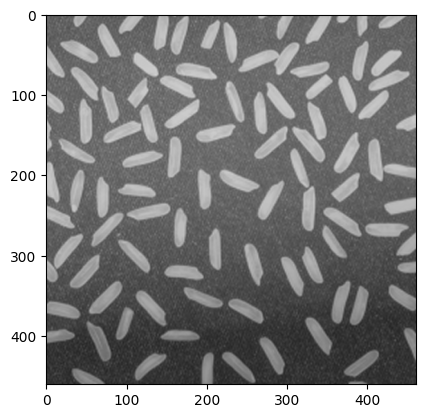

(461, 461, 3)


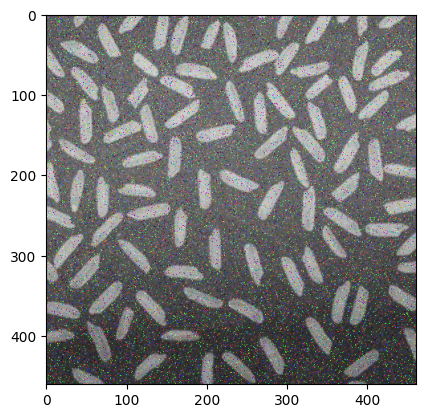

(461, 461, 3)


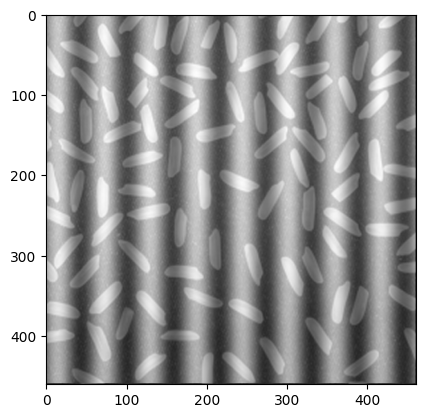

(461, 461, 3)


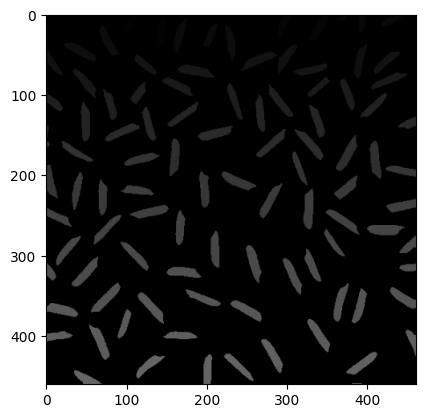

(461, 461, 3)


In [ ]:
for i in range (1,5):
  plt.imshow(eval('img'+str(i)))
  plt.show()
  print(eval('img'+str(i)).shape)


In [ ]:
img1_g=cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
img2_g=cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
img3_g=cv2.cvtColor(img3,cv2.COLOR_BGR2GRAY)
img4_g=cv2.cvtColor(img4,cv2.COLOR_BGR2GRAY)
for i in range (1,5):
  print(eval('img'+str(i)+'_g').shape)
  print(np.unique(eval('img'+str(i)+'_g')) )# xac dinh loai anh


(461, 461)
[ 34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51
  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69
  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87
  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105
 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123
 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141
 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159
 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177
 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195
 196 197 198 199 200 201 202 203 204 205 206 207 209 210 211]
(461, 461)
[  0   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21
  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39
  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67

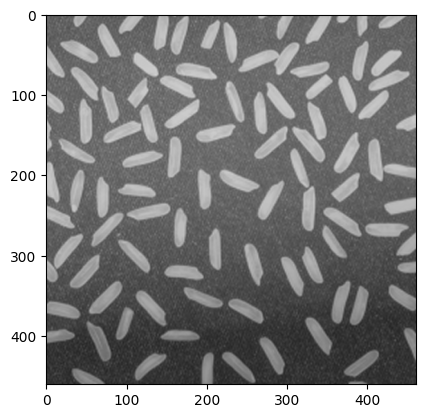

(461, 461)


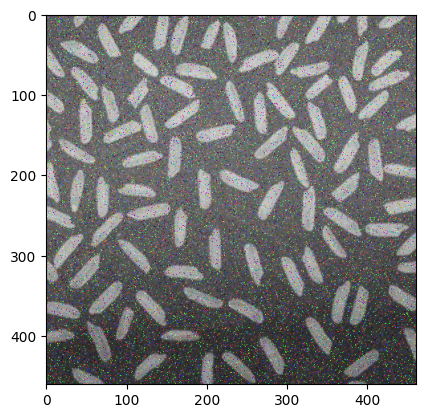

(461, 461)


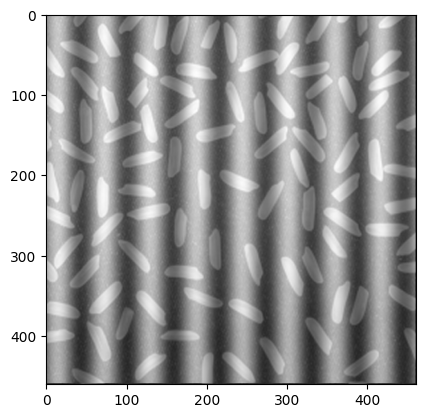

(461, 461)


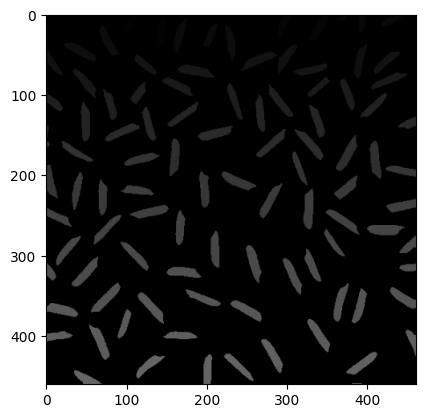

(461, 461)


In [ ]:
for i in range (1,5):
  plt.imshow(eval('img'+str(i)))
  plt.show()
  print(eval('img'+str(i)+'_g').shape)

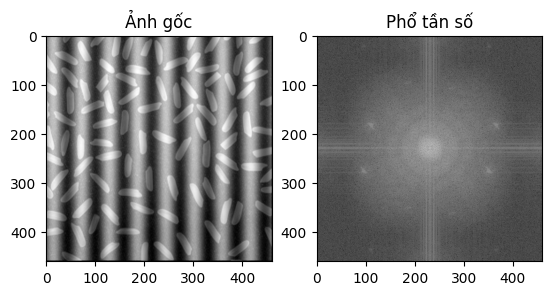

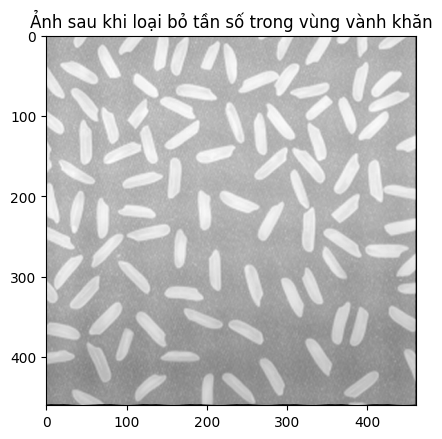

In [ ]:
def xulysin(img, r_min=20, r_max=50):
    # Biến đổi Fourier
    image = img
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # Hiển thị phổ tần số
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    plt.subplot(121), plt.imshow(image, cmap='gray'), plt.title('Ảnh gốc')
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('Phổ tần số')
    plt.show()

    # Lọc nhiễu: loại bỏ tần số trong vùng vành khăn
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2  # Tìm tâm của ảnh

    # Tạo mặt nạ hình tròn
    Y, X = np.ogrid[:rows, :cols]
    distance_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)

    # Mặt nạ ban đầu là 1 (tất cả tần số đều được giữ lại)
    mask = np.ones((rows, cols, 2), np.uint8)

    # Loại bỏ các tần số trong vùng vành khăn (tần số trung gian)
    mask[(distance_from_center >= r_min) & (distance_from_center <= r_max)] = 0

    # Áp dụng mặt nạ vào phổ
    fshift = dft_shift * mask

    # Biến đổi ngược Fourier
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    # Chuẩn hóa và hiển thị ảnh sau khi xử lý
    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)

    # Chuyển ảnh thành kiểu uint8 trước khi hiển thị
    img_back = img_back.astype(np.uint8)

    # Hiển thị ảnh sau khi loại bỏ nhiễu
    plt.imshow(img_back, cmap='gray')
    plt.title('Ảnh sau khi loại bỏ tần số trong vùng vành khăn')
    plt.show()

    return img_back

# Giả sử `img3_g` là ảnh đầu vào của bạn
img4_sin = xulysin(img3_g, r_min=8, r_max=8)

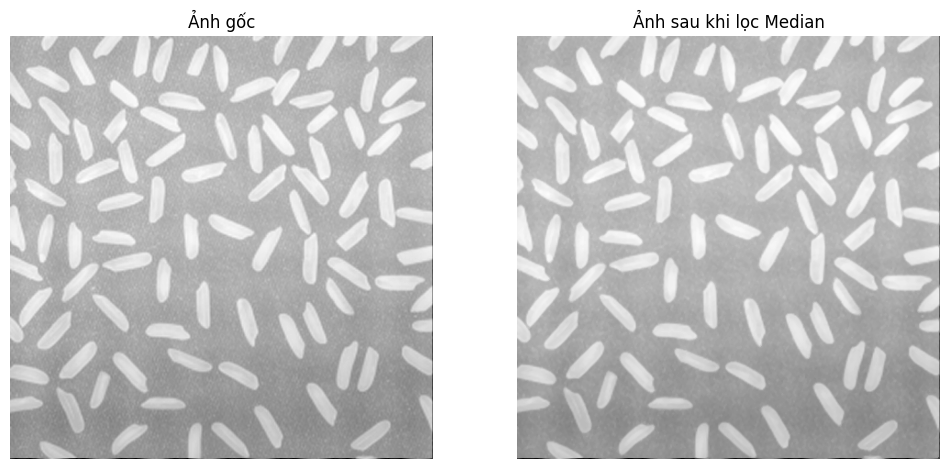

In [ ]:
#xu ly nhieu muoi tieu voi bo loc median
def xuly_median_filter(img, kernel_size=3):
    """
    Hàm xử lý ảnh bằng bộ lọc Median để loại bỏ nhiễu muối tiêu.
    :return: Ảnh sau khi xử lý với bộ lọc Median.
    """
    if img.dtype != np.uint8:
      img = np.uint8(img * 255)  # Chuyển đổi giá trị ảnh về phạm vi [0, 255] và kiểu dữ liệu uint8

    # Áp dụng bộ lọc Median
    img_filtered = cv2.medianBlur(img, kernel_size)

    # Hiển thị ảnh gốc và ảnh sau khi xử lý
    plt.figure(figsize=(12, 6))

    # Ảnh gốc
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Ảnh gốc')
    plt.axis('off')

    # Ảnh sau khi lọc Median
    plt.subplot(1, 2, 2)
    plt.imshow(img_filtered, cmap='gray')
    plt.title('Ảnh sau khi lọc Median')
    plt.axis('off')

    # Hiển thị các hình ảnh
    plt.show()

    return img_filtered

# Gọi hàm xử lý ảnh với Median Filter
result_img = xuly_median_filter(img4_sin, kernel_size=3)

In [ ]:
#thu voi bo loc gaussian
def xuly_gaussian_filter(img, kernel_size=5, sigma=1.0):
    """
    Hàm xử lý ảnh bằng bộ lọc Gaussian để loại bỏ nhiễu.

    :param img: Ảnh đầu vào (dưới dạng numpy array).
    :param kernel_size: Kích thước của cửa sổ lọc (kernel), phải là số lẻ (5, 7, 9,...).
    :param sigma: Độ lệch chuẩn của bộ lọc Gaussian, điều chỉnh mức độ làm mờ.
    :return: Ảnh sau khi xử lý với bộ lọc Gaussian.
    """
    # Áp dụng bộ lọc Gaussian
    img_filtered = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)

    # Hiển thị ảnh gốc và ảnh sau khi xử lý
    plt.figure(figsize=(12, 6))

    # Ảnh gốc
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Ảnh gốc')
    plt.axis('off')

    # Ảnh sau khi lọc Gaussian
    plt.subplot(1, 2, 2)
    plt.imshow(img_filtered, cmap='gray')
    plt.title('Ảnh sau khi lọc Gaussian')
    plt.axis('off')

    # Hiển thị các hình ảnh
    plt.show()

    return img_filtered

# Gọi hàm xử lý ảnh với Gaussian Filter
result_img = //xuly_gaussian_filter(img4_sin, kernel_size=15, sigma=1.5) #kernel size is odd

SyntaxError: invalid syntax (<ipython-input-8-5f9c6ea422dd>, line 35)

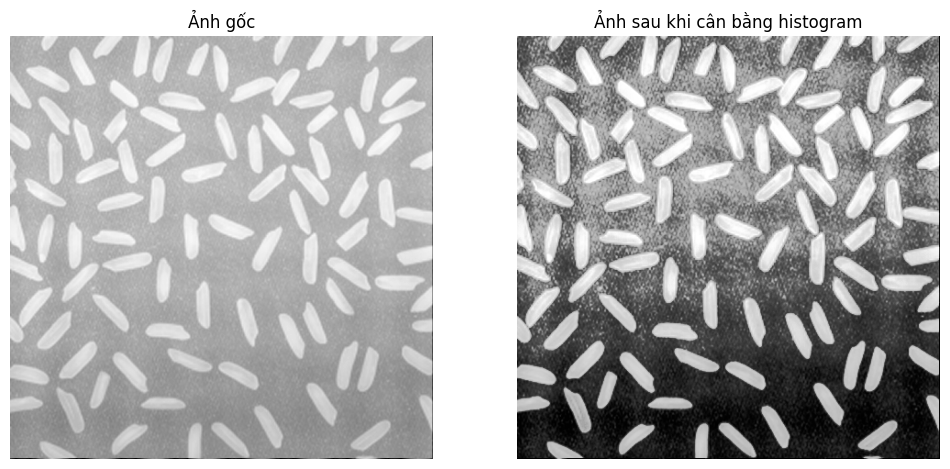

In [ ]:
#tang do tuong phan cua anh bang histogram
def histogram_equalization(img):
    # Cân bằng histogram (cho ảnh grayscale)
    img_eq = cv2.equalizeHist(img)

    # Hiển thị ảnh gốc và ảnh đã cân bằng histogram
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Ảnh gốc')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_eq, cmap='gray')
    plt.title('Ảnh sau khi cân bằng histogram')
    plt.axis('off')

    plt.show()

    return img_eq

# Đọc ảnh
result_img = histogram_equalization(img4_sin)

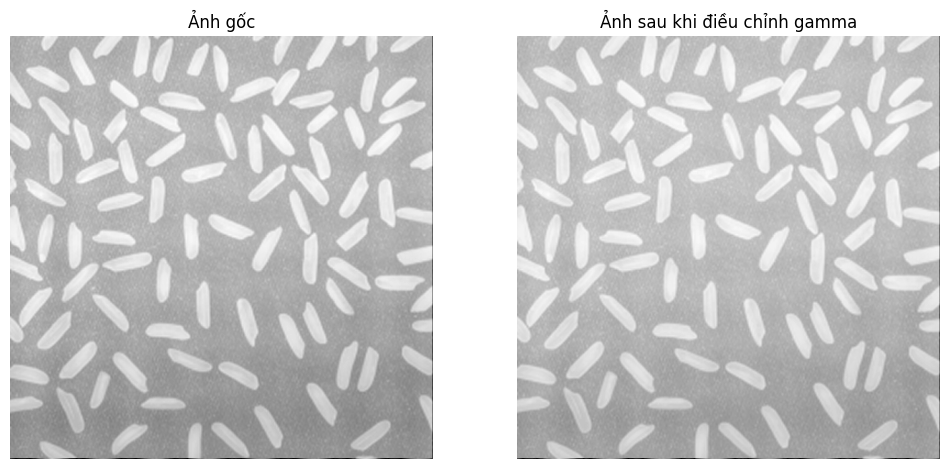

In [ ]:
#tang do tuong phan bang ham gamma
def gamma_correction(img, gamma=1.2):
    """
    Hàm tăng cường độ tương phản bằng cách áp dụng Gamma Correction.

    Parameters:
        img (numpy.ndarray): Ảnh đầu vào (grayscale hoặc ảnh màu).
        gamma (float): Chỉ số gamma, điều chỉnh độ sáng (gamma < 1 làm sáng ảnh, gamma > 1 làm tối ảnh).

    Returns:
        img_gamma (numpy.ndarray): Ảnh sau khi áp dụng Gamma Correction.
    """
    # Kiểm tra xem ảnh có phải là ảnh grayscale hoặc ảnh màu
    if len(img.shape) != 2 and len(img.shape) != 3:
        raise ValueError("Ảnh đầu vào phải là ảnh grayscale hoặc ảnh màu")

    # Tạo bảng tra cứu gamma cho ảnh grayscale
    lookup_table = np.array([((i / 255.0) ** gamma) * 255 for i in range(256)], dtype="uint8")

    # Áp dụng gamma correction cho từng pixel trong ảnh
    if len(img.shape) == 2:  # Ảnh grayscale
        img_gamma = cv2.LUT(img, lookup_table)
    elif len(img.shape) == 3:  # Ảnh màu (RGB)
        img_gamma = np.zeros_like(img)
        for i in range(3):  # Xử lý từng kênh màu (Red, Green, Blue)
            img_gamma[:, :, i] = cv2.LUT(img[:, :, i], lookup_table)

    # Hiển thị ảnh gốc và ảnh sau khi điều chỉnh gamma
    plt.figure(figsize=(12, 6))

    # Ảnh gốc
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 else img, cmap='gray')
    plt.title('Ảnh gốc')
    plt.axis('off')

    # Ảnh sau khi điều chỉnh gamma
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_gamma, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 else img_gamma, cmap='gray')
    plt.title('Ảnh sau khi điều chỉnh gamma')
    plt.axis('off')

    plt.show()

    return img_gamma


# Tăng cường độ tương phản cho ảnh bằng gamma correction
result_img = gamma_correction(img4_sin, gamma=0.83)  # Thử gamma = 1.2 để làm ảnh sáng hơn


In [ ]:
#tang do tuong phan voi ham loga
def logarithmic_transformation(img, c=1.0):
    """
    Hàm tăng cường độ tương phản bằng cách áp dụng Logarithmic Transformation cho ảnh grayscale.

    Parameters:
        img (numpy.ndarray): Ảnh grayscale đầu vào.
        c (float): Hằng số điều chỉnh, giúp kiểm soát độ sáng của ảnh sau khi biến đổi.

    Returns:
        img_log (numpy.ndarray): Ảnh sau khi áp dụng Logarithmic Transformation.
    """
    # Kiểm tra xem ảnh có phải là ảnh grayscale
    if len(img.shape) != 2:
        raise ValueError("Ảnh đầu vào phải là ảnh grayscale")

    # Áp dụng Logarithmic Transformation cho ảnh grayscale
    img_log = np.zeros_like(img, dtype=np.float32)  # Khởi tạo ảnh kết quả
    img_log = c * np.log(1 + np.float32(img))  # Áp dụng hàm log cho giá trị pixel

    # Chuyển ảnh về lại giá trị pixel trong khoảng [0, 255]
    img_log = np.uint8(np.clip(img_log, 0, 255))

    # Hiển thị ảnh gốc và ảnh sau khi áp dụng Logarithmic Transformation
    plt.figure(figsize=(12, 6))

    # Ảnh gốc
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Ảnh gốc')
    plt.axis('off')

    # Ảnh sau khi Logarithmic Transformation
    plt.subplot(1, 2, 2)
    plt.imshow(img_log, cmap='gray')
    plt.title('Ảnh sau khi Logarithmic Transformation')
    plt.axis('off')

    plt.show()

    return img_log



# Tăng cường độ tương phản cho ảnh bằng Logarithmic Transformation
result_img =// logarithmic_transformation(img4_sin, c=0.28)  # Điều chỉnh c để kiểm soát độ sáng

SyntaxError: invalid syntax (<ipython-input-88-22ecc6965867>, line 46)

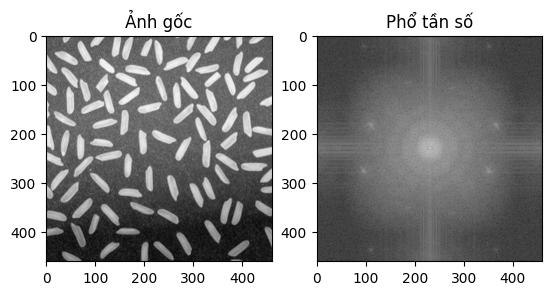

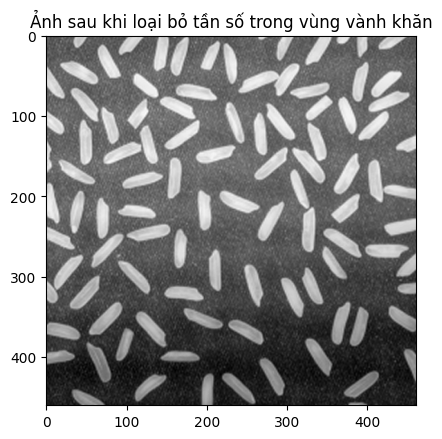

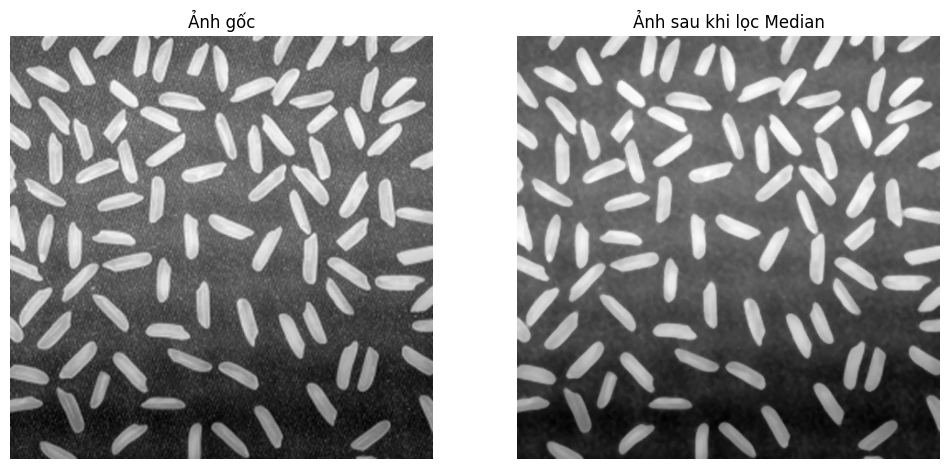

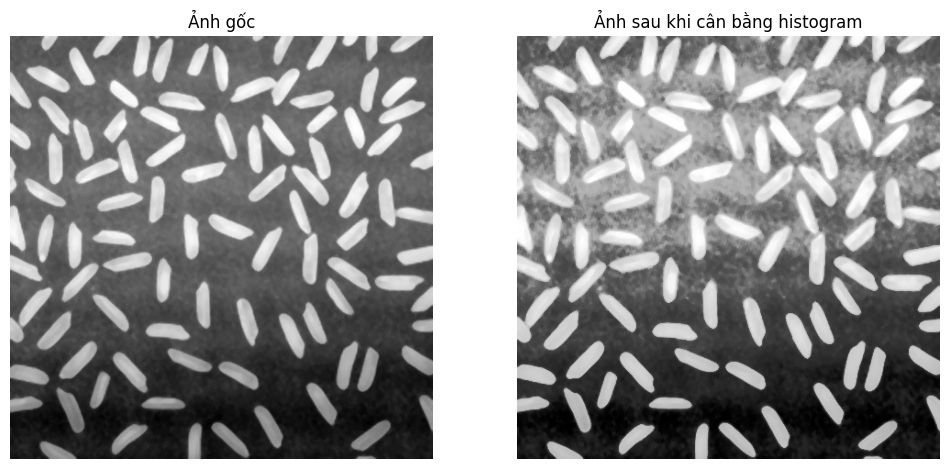

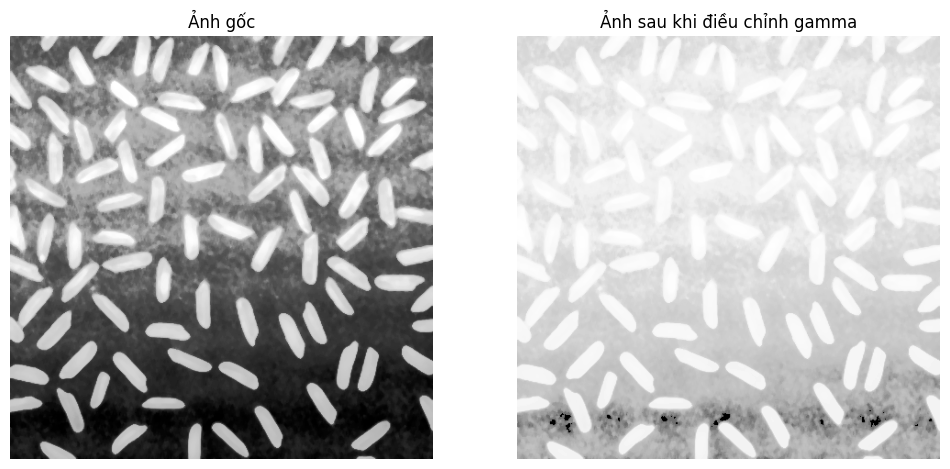

...

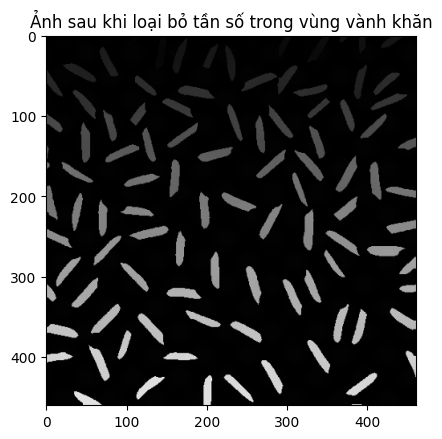

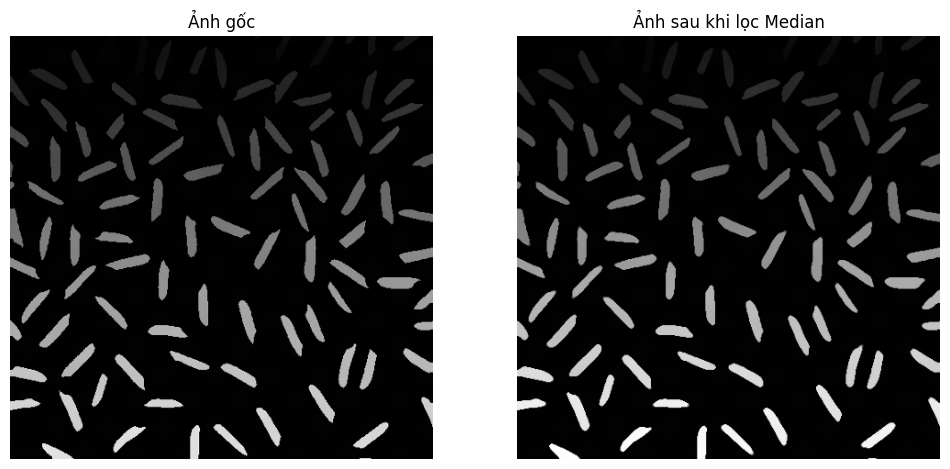

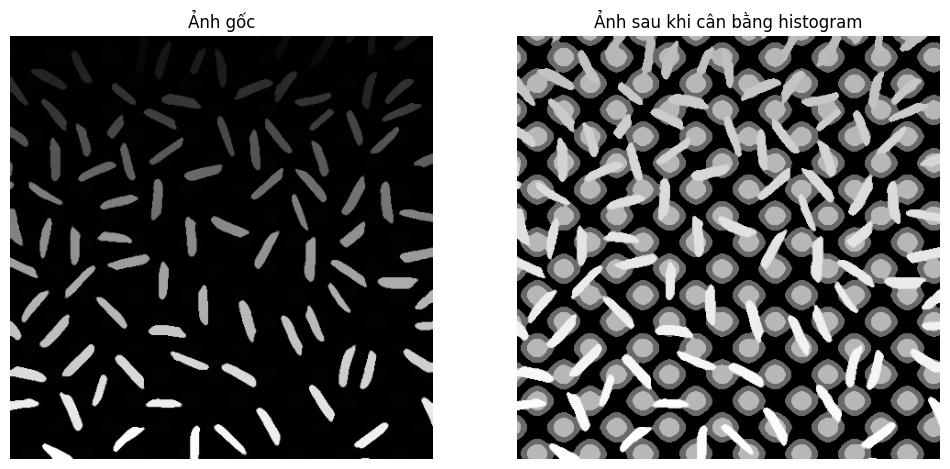

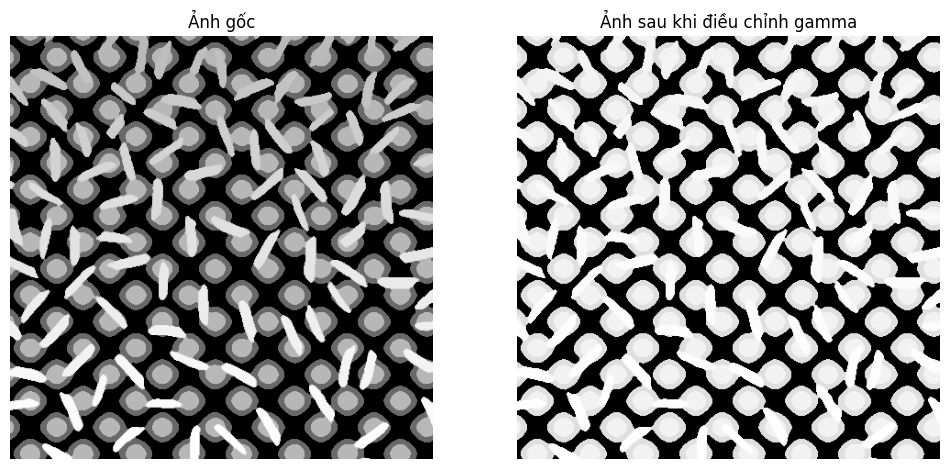

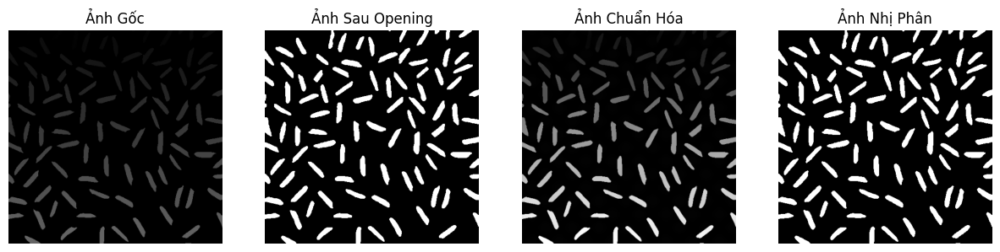

Ảnh 1: Số thành phần liên thông = 90
Ảnh 2: Số thành phần liên thông = 93
Ảnh 3: Số thành phần liên thông = 92
Ảnh 4: Số thành phần liên thông = 98


In [ ]:
# Hàm chuẩn hóa ảnh
def chuan_hoa_anh(img):
    normalized_img = cv2.normalize(img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    return np.uint8(normalized_img)

# Hàm chuyển ảnh về nhị phân
def chuyen_ve_nhi_phan(img, threshold_value=127):
    _, binary_img = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)
    return binary_img

# Hàm thực hiện phép Opening
def perform_opening(input_image, kernel_size=5):
    """
    Hàm thực hiện phép Opening trên ảnh nhị phân và trả về ảnh kết quả.
    """
    # Nếu ảnh đầu vào là ảnh màu, chuyển sang ảnh xám
    if len(input_image.shape) == 3:
        img = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
    else:
        img = input_image

    # Chuyển ảnh sang nhị phân nếu chưa phải ảnh nhị phân
    _, binary_img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

    # Tạo kernel (cấu trúc hình học), ví dụ là ma trận vuông với kích thước kernel_size x kernel_size
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # Thực hiện phép Opening (erosion trước, dilation sau)
    opening_img = cv2.morphologyEx(binary_img, cv2.MORPH_OPEN, kernel)

    return opening_img

# Hàm xử lý ảnh với các bước chuẩn hóa, lọc, và biến đổi
def xulyanh(img):
    img_g = img  # Ảnh đầu vào

    # Giả sử bạn có các hàm như xulysin, xuly_median_filter, histogram_equalization, gamma_correction
    # Cần đảm bảo những hàm này được định nghĩa hoặc cài đặt đúng trước khi sử dụng.
    img_sin = xulysin(img_g, r_min=8, r_max=8)  # Giả sử xử lý sin (mẫu chưa có hàm xulysin)
    img_median = xuly_median_filter(img_sin, kernel_size=5)  # Áp dụng median filter
    img_normalized = chuan_hoa_anh(img_median)  # Chuẩn hóa giá trị về 0-255
    img_histo = histogram_equalization(img_normalized)  # Cân bằng histogram
    img_gamma = gamma_correction(img_histo, gamma=0.15)  # Hiệu chỉnh gamma
    img_binary = chuyen_ve_nhi_phan(img_gamma, threshold_value=242)  # Chuyển sang ảnh nhị phân
    img_opening = perform_opening(img_binary, kernel_size=3)  # Thực hiện phép Opening

    # Hiển thị ảnh gốc và ảnh sau xử lý
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.title("Ảnh Gốc")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title("Ảnh Chuẩn Hóa")
    plt.imshow(img_normalized, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Ảnh Nhị Phân")
    plt.imshow(img_binary, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title("Ảnh Sau Opening")
    plt.imshow(img_opening, cmap='gray')
    plt.axis('off')
    plt.show()

    return img_opening

# Hàm DFS để tìm và đánh dấu các thành phần liên thông
def dfs(img, x, y, visited):
    # Các bước di chuyển (trái, phải, trên, dưới)
    directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    stack = [(x, y)]  # Sử dụng stack cho DFS

    while stack:
        cx, cy = stack.pop()  # Lấy pixel hiện tại
        if visited[cx, cy]:
            continue  # Nếu pixel đã được thăm thì bỏ qua
        visited[cx, cy] = True  # Đánh dấu pixel này là đã thăm

        # Duyệt các pixel lân cận
        for dx, dy in directions:
            nx, ny = cx + dx, cy + dy
            if 0 <= nx < img.shape[0] and 0 <= ny < img.shape[1] and not visited[nx, ny] and img[nx, ny] == 255:
                stack.append((nx, ny))  # Thêm pixel vào stack nếu là pixel liên thông

# Hàm xác định số thành phần liên thông
def count_connected_components(img):
    visited = np.zeros_like(img, dtype=bool)  # Mảng đánh dấu các pixel đã thăm
    component_count = 0

    for i in range(img.shape[0]):  # Duyệt qua tất cả các pixel
        for j in range(img.shape[1]):
            if img[i, j] == 255 and not visited[i, j]:  # Nếu pixel là 255 và chưa được thăm
                dfs(img, i, j, visited)  # Thực hiện DFS từ pixel này
                component_count += 1  # Tăng số lượng thành phần liên thông

    return component_count

# Hàm xử lý và đếm thành phần liên thông cho nhiều ảnh
def process_and_count(images):
    results = {}
    for i, img in enumerate(images, start=1):
        result_img = xulyanh(img)  # Xử lý ảnh
        num_components = count_connected_components(result_img)  # Đếm thành phần liên thông
        results[f"Ảnh {i}"] = num_components
    return results

# Ví dụ sử dụng với nhiều ảnh đầu vào
# Giả sử bạn có các ảnh img1_g, img2_g, img3_g, img4_g đã được đọc từ đâu đó
images = [img1_g, img2_g, img3_g, img4_g]  # Đây là các ảnh đầu vào
results = process_and_count(images)  # Xử lý và đếm thành phần liên thông cho các ảnh

# In ra kết quả
for img_label, num_components in results.items():
    print(f"{img_label}: Số thành phần liên thông = {num_components}")


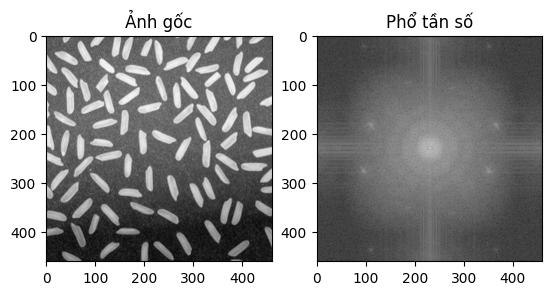

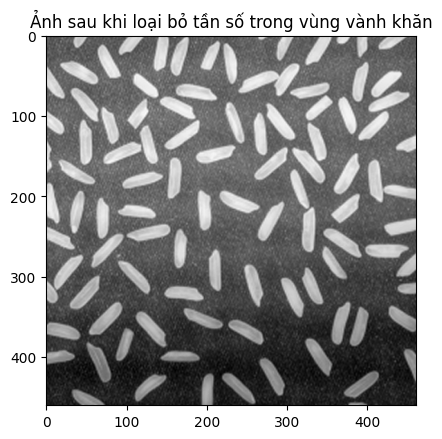

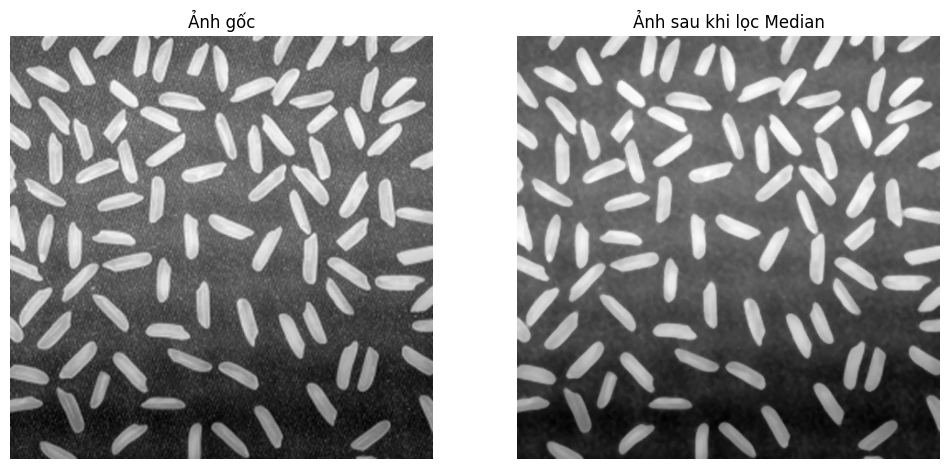

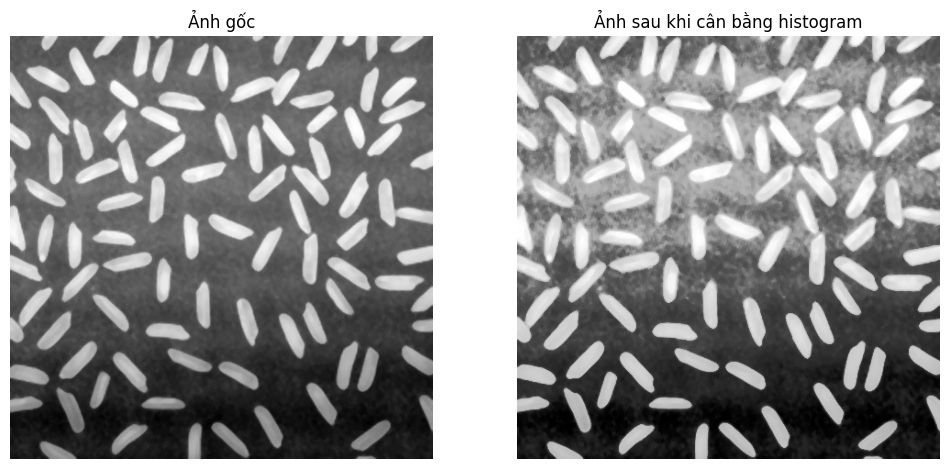

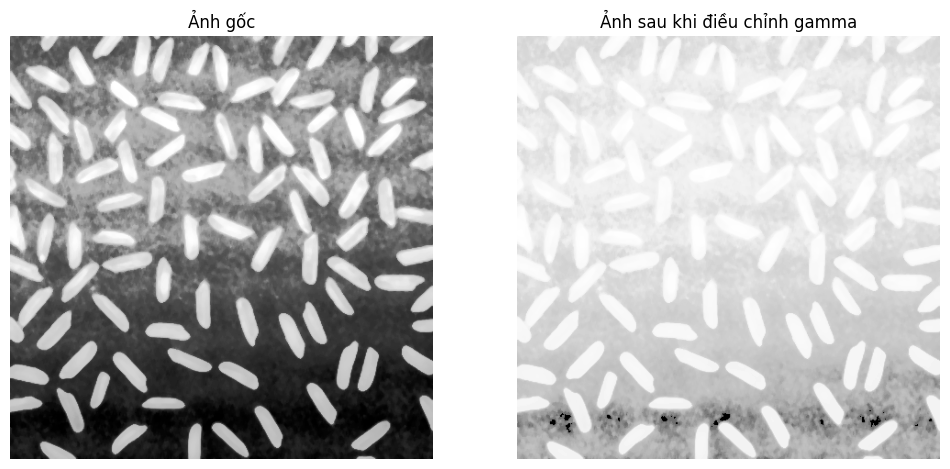

...

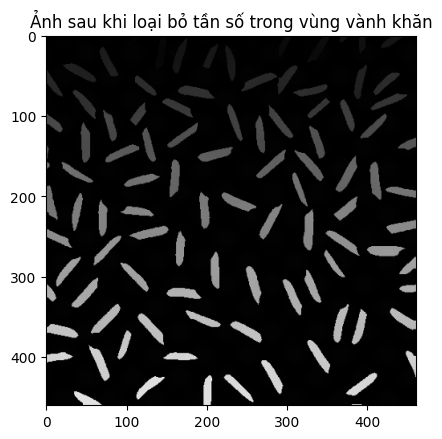

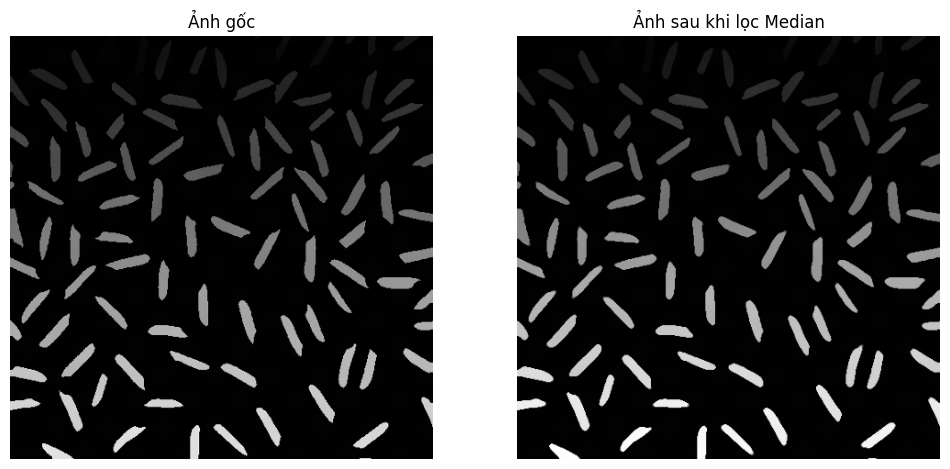

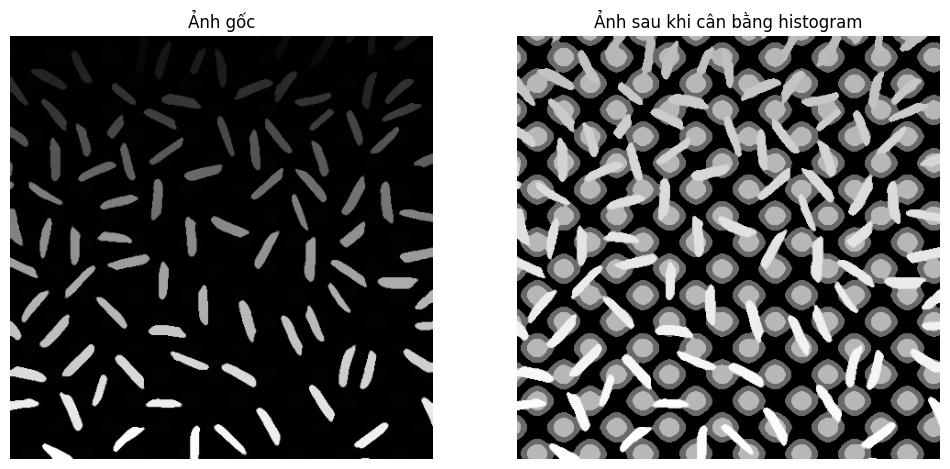

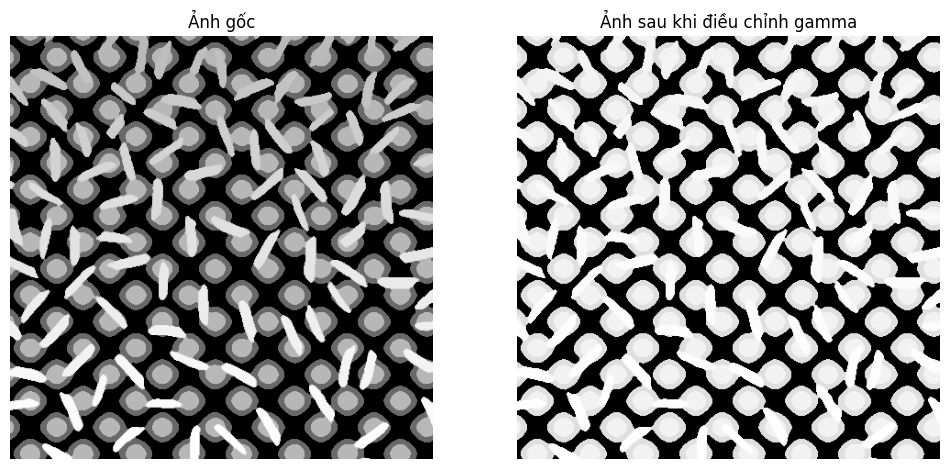

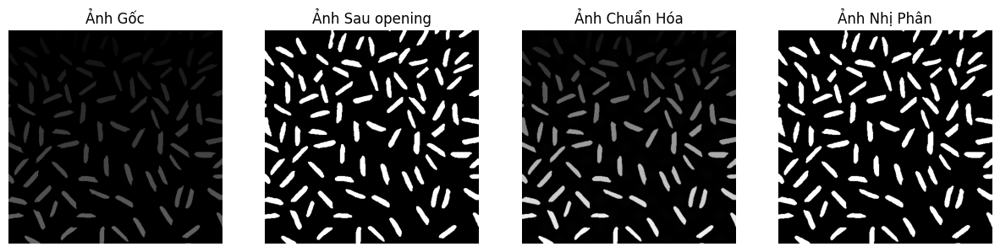

so thanh phan lien thong thu 1 la 0
so thanh phan lien thong thu 2 la 0
so thanh phan lien thong thu 3 la 0
so thanh phan lien thong thu 4 la 0


In [ ]:
s1=xulyanh(img1_g)
s2=xulyanh(img2_g)
s3=xulyanh(img3_g)
s4=xulyanh(img4_g)
for i in range (1,5):
  print(f"so thanh phan lien thong thu {i} la {count_connected_components(eval('s'+str(i)))}")

In [ ]:
import numpy as np
import cv2
from scipy.fft import fft2, fftshift, ifft2, ifftshift
import matplotlib.pyplot as plt

def apply_gaussian_mask(shape, sigma=10):
    """
    Tạo mặt nạ Gaussian cho lọc thông thấp.
    Args:
        shape (tuple): Kích thước của ảnh hoặc phổ Fourier (height, width).
        sigma (float): Độ lệch chuẩn cho mặt nạ Gaussian.
    Returns:
        numpy.ndarray: Mặt nạ Gaussian.
    """
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2  # Trung tâm của phổ
    x, y = np.meshgrid(np.arange(cols), np.arange(rows))
    distance = np.sqrt((x - ccol)**2 + (y - crow)**2)
    gaussian_mask = np.exp(-(distance**2) / (2 * sigma**2))
    return gaussian_mask

def xulysin(img, r=70, sigma=10):
    """
    Xử lý nhiễu sin bằng cách áp dụng mặt nạ Gaussian trong miền Fourier.

    Args:
        img (numpy.ndarray): Ảnh grayscale đầu vào.
        r (int): Bán kính vùng tần số cần làm mờ.
        sigma (float): Độ lệch chuẩn cho Gaussian mask.

    Returns:
        numpy.ndarray: Ảnh sau khi lọc nhiễu.
    """
    # Chuyển ảnh sang miền Fourier
    img_fft = fft2(img)
    img_fft_shifted = fftshift(img_fft)

    # Tính phổ Fourier để xác định vị trí nhiễu
    magnitude_spectrum = np.log(1 + np.abs(img_fft_shifted))

    # Tạo mặt nạ Gaussian cho lọc thông thấp
    gaussian_mask = apply_gaussian_mask(img_fft_shifted.shape, sigma=sigma)

    # Áp dụng mặt nạ vào phổ Fourier
    filtered_fft = img_fft_shifted * gaussian_mask

    # Chuyển ngược về miền không gian
    filtered_image = np.abs(ifft2(ifftshift(filtered_fft)))

    return filtered_image

In [ ]:
#1 vai danh gia